In [1]:
from IPython import get_ipython

 # Gibbs Sampling Multivariate Case
 ## Introduction
 Upon researching how to implement gibbs sampling I noticed that it is actually quite simple to implement. Especially for the bivariate case.
 However, this may be the reason why it is actually quite hard to find good examples on how to do gibbs sampling in the case that you actually have more than 2 variables.
 You can check it yourself. The internet loves the bivariate case! However, several questions arise if you want to work with more than two variables.
 Mainly how to condition on multiple variables and which cells to choose for the ensuing normal distribution?

 This post will not dive into the specifics of Gibbs Sampling again. Many others have explained it far better:
 - See: https://www.youtube.com/watch?v=7LB1VHp4tLE (Youtube)
 - See: https://towardsdatascience.com/gibbs-sampling-8e4844560ae5 (Blog Article)

 However, I will specifically address the multivariate case. Therefore, I will mostly follow the code of Jessica Stringham.
 Her blog post has actually helped me the most, so it will be necessary to read her blog article first.
 - See: https://jessicastringham.net/2018/05/09/gibbs-sampling/


 ## Creating the true distribution
 As we need to sanity check whether our approach is actually working we first need to construct a true distribution.
 This is the distribution we want to sample with gibbs sampling.

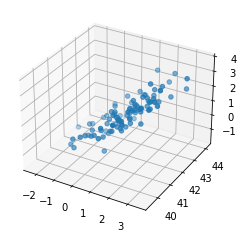

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats


cov_ab = 0.1
cov_ac = 0.9
cov_bc = 0.1

means = np.array([[1, 42, 1]]).T
covs = np.array([[1, cov_ab, cov_ac], [cov_ab, 1, cov_bc], [cov_ac, cov_bc,
                                                            1]])
D = means.shape[0]
N = 100

stdevs = np.linalg.cholesky(covs)

true_sample = stdevs @ np.random.randn(D, N) + means

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(true_sample[0], true_sample[1], true_sample[2])  # %%

 ## The multivariate case
 Let's explain the confusing part about the multivariate case. Many examples show these two formulas

 ![formula](./res/conditional_formula.png)
 The first formula shows the form of a bivariate normal distribution. Hence, it is clear that **a & b** are means, **A & B** the variances and **C & C^T** the covariance of f and g.
 The second formula explains how to compute the conditional normaldistribution for f knowing **a,b,A,B,C and g**.
 This is all simple for the bivariate case but what about three or four variables?

 Let's check out this mean-vector and covariance matrix for a multivariate normaldistribution of 4 random variables.
 
 ![formula](./res/vector.png)

 ![formula](./res/matrix.png)

 In the case of the mean, the trick is to know see that **a** from the conditional formula will remain **a** in the new mean vector.
 However, **b** will not be just a scalar but rather the remaining mean vector - **b,c & d**.

 This is quite similar for the covariance matrix.
 **A** will be **aa** in the new covariance matrix.
 **C** will be the remaining row or column of the **aa** cell -- Either (ab, ac, ad) or (ba, ca, da).
 **B** will correspond to the remaining matrix -- (bb, bc, bd, cb, cc, cd, db, dc, dd).

 ![formula](./res/mod_matrix.png)

 That's essentially it. Now we can use the formula as we know it. It's is just about *seeing* the parts in the multivariate case.
 For the gibbs sampling procedure, in which you have to iterate through every random variable, I decided to just shift values in the matrix, so that I don't have to tediously construct A, B and C for each dimension.
 The remainder is taken' from jessica's implementation with very few variations.

In [3]:
def shift_covs(X, var_index):
    return np.roll(np.roll(X, -var_index, axis=0), -var_index, axis=1)


def shift_means(X, var_index):
    return np.roll(X, -var_index, axis=0)

In [4]:
def get_conditional_dist(joint_mu, joint_cov, var_index):
    '''Returns the conditional distribution given the joint distribution and which variable
    the conditional probability should use.
    Right now this only works for 2-variable joint distributions.
    
      joint_mu: joint distribution's mu
      joint_cov: joint distribution's covariance
      var_index: index of the variable in the joint distribution. Everything else will be 
        conditioned on. For example, if the joint distribution p(a, b, c) has mu [mu_a, mu_b, mu_c],
        to get p(c | a, b), use var_index = 2.
      
    returns:
      a function that can sample from the univariate conditional distribution
    '''
    shifted_joint_mu = shift_means(joint_mu, var_index)
    shifted_joint_cov = shift_covs(joint_cov, var_index)

    a = shifted_joint_mu[0]
    b = shifted_joint_mu[1:]

    A = shifted_joint_cov[0, 0]
    B = shifted_joint_cov[1:, 1:]
    C = shifted_joint_cov[1:, 0]

    # we're dealing with one dimension so
    B_inv = np.linalg.inv(B)

    # Return a function that can sample given a value of g
    def dist(g):
        # a + C*B^{-1}(g - b)
        mu = a + C @ B_inv @ (g - b)
        # A - C * B^{-1} * C^T
        cov = A - C @ B_inv @ C
        return np.sqrt(cov) * np.random.randn(1) + mu

    return dist


multivariate_conditionals = [
    get_conditional_dist(means, covs, d) for d in range(D)
]
multivariate_conditionals

[<function __main__.get_conditional_dist.<locals>.dist(g)>,
 <function __main__.get_conditional_dist.<locals>.dist(g)>,
 <function __main__.get_conditional_dist.<locals>.dist(g)>]

In [5]:
def gibbs_sample(multivariate_conditionals, sample_count):
    '''Does Gibbs sampling given the distribution's univariate conditionals.
    
    Returns a D x N matrix
    '''
    D = len(multivariate_conditionals)

    # initializes an empty matrix for the samples
    samples = np.zeros((D, sample_count))

    # initialize the first sample to some arbitrary value
    samples[:, 0] = np.ones_like(samples[:, 0]) * 3

    for i in range(1, sample_count):
        # first set this sample equal to the previous sample
        samples[:, i] = samples[:, i - 1]

        # now update the dimension whose turn it is using the conditional distribution
        # pass in all dimension from the previous sample except this dimension
        d = i % D
        g = np.array([shift_means(samples[:, i - 1], d)[1:]]).T
        samples[d, i] = multivariate_conditionals[d](g)

    return samples


samples = gibbs_sample(multivariate_conditionals, sample_count=100)
samples.T

array([[ 3.        ,  3.        ,  3.        ],
       [ 3.        , 43.82080687,  3.        ],
       [ 3.        , 43.82080687,  2.48242943],
       [ 2.47417436, 43.82080687,  2.48242943],
       [ 2.47417436, 42.31626859,  2.48242943],
       [ 2.47417436, 42.31626859,  2.4222619 ],
       [ 2.64162868, 42.31626859,  2.4222619 ],
       [ 2.64162868, 42.32955564,  2.4222619 ],
       [ 2.64162868, 42.32955564,  2.9589855 ],
       [ 1.83127525, 42.32955564,  2.9589855 ],
       [ 1.83127525, 41.8799214 ,  2.9589855 ],
       [ 1.83127525, 41.8799214 ,  1.69853278],
       [ 1.1759929 , 41.8799214 ,  1.69853278],
       [ 1.1759929 , 42.70675156,  1.69853278],
       [ 1.1759929 , 42.70675156,  1.36927477],
       [ 1.11097749, 42.70675156,  1.36927477],
       [ 1.11097749, 42.02198842,  1.36927477],
       [ 1.11097749, 42.02198842,  1.35950608],
       [ 2.08478518, 42.02198842,  1.35950608],
       [ 2.08478518, 43.01603563,  1.35950608],
       [ 2.08478518, 43.01603563,  1.875

 Lastly let's check if the sampling approach did work in the end.

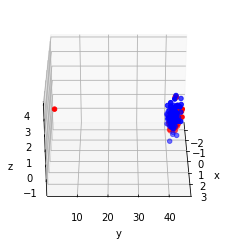

In [6]:
# 
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from numpy.random import rand
from IPython.display import HTML
from matplotlib import animation

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(true_sample[0], true_sample[1], true_sample[2], c="blue")  # %%
ax.scatter(samples[0], samples[1], samples[2], c="red")  # %%

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

def animate(frame):
  ax.view_init(30, frame/4)
  plt.pause(.001)
  return fig

anim = animation.FuncAnimation(fig, animate, frames=300, interval=50)
HTML(anim.to_jshtml())